## Chapter 7
# Introduction to Acoustics

This chapter touches on a lot of interesting wave behavior, including wave properties over different media, across media boundaries, constructive and destructive interference, _Fraunhofer diffraction_ in which coherent plane waves incident upon an obstruction, _Fresnel diffraction_, where the curvature of the wave fronts is taken into account, the doppler effect, room acoustics and many other acoustic phenomena.

(In looking for supplementary material I found this [video from the AT&T Archives: Similarities of Wave Behavior](https://youtu.be/DovunOxlY1k) which uses the "Shive wave machine" discussed in the book to demonstrate some wave behaviors.  It's a good watch :) )

Below I explore a bit of diffraction and doppler effect. See [my notebook for Chapter 4](https://nbviewer.jupyter.org/github/khiner/notebooks/tree/master/musimathics/volume_1/chapter_4_physical_basis_of_sound.ipynb) (Physical Basis of Sound) for transverse wave simulations, which are discussed a bit more in this chapter as well.

## Diffraction

On p225, the author discusses the "Airy disc" pattern corresponding to Fraunhofer diffraction through a circular aperture, and he briefly mentions that diffraction through other aperture shapes requires different equations.

In looking for resources to try my hand at diffraction simulations, I found this fantastic [poppy (Physical Optics Propagation in PYthon) library](http://poppy-optics.readthedocs.io/) library and found myself playing with it for a long time!  Below are a couple examples more or less straight from the [poppy examples page](http://poppy-optics.readthedocs.io/en/stable/examples.html): the first is a static picture of the above mentioned _Airy disc_ pattern due to Fraunhofer diffraction (**_see below for my manual attempt at a similar plot_**), and the other is a hi-res animation I made whilst getting carried away with exploring some examples of those "other aperture shapes" the author mentions.

_(Note that if you run this notebook yourself the video will likely take more than 10 minutes to render all 5 seconds!)_

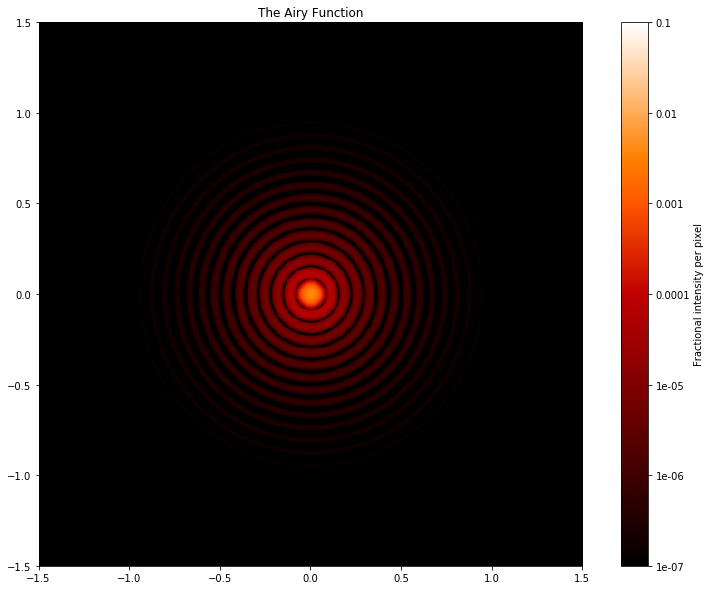

In [1]:
import poppy
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (14, 10)

osys = poppy.OpticalSystem()
osys.add_pupil(poppy.CircularAperture(radius=3))    # pupil radius in meters
osys.add_detector(pixelscale=0.010, fov_arcsec=3.0)  # image plane coordinates in arcseconds

psf = osys.calc_psf(2e-6)                            # wavelength in microns
poppy.display_PSF(psf, title='The Airy Function')

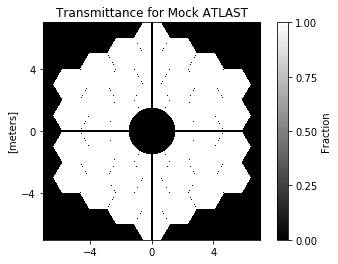

In [2]:
# This section is taken exactly from http://poppy-optics.readthedocs.io/en/stable/examples.html

# 3 rings of 2 m segments yields 14.1 m circumscribed diameter
ap = poppy.MultiHexagonAperture(rings=3, flattoflat=2)
# secondary with spiders
sec = poppy.SecondaryObscuration(secondary_radius=1.5, n_supports=4, support_width=0.1)
# combine into one optic
atlast = poppy.CompoundAnalyticOptic(opticslist=[ap, sec], name='Mock ATLAST')

atlast.display(npix=1024, colorbar_orientation='vertical')

In [3]:
from matplotlib import animation
from IPython.display import HTML
import numpy as np
plt.rcParams['figure.figsize'] = (14, 10)

fig, ax = plt.subplots()
fig.suptitle('Changing wavelength through complex aperture', size=16)
osys = poppy.OpticalSystem()
osys.add_pupil(atlast)
osys.add_detector(pixelscale=0.01, fov_arcsec=2.0)

frames_per_sec = 24
num_frames = frames_per_sec * 5

wavelengths_microns = np.logspace(-5, -10, num_frames)

def animate(i):
    psf = osys.calc_psf(wavelengths_microns[i])
    poppy.display_PSF(psf, ax=ax)
    ax.set_title('Wavelength = %.2e µm' % wavelengths_microns[i], size=14)

anim = animation.FuncAnimation(fig, animate, frames=num_frames, interval=1_000/frames_per_sec)
vid = HTML(anim.to_html5_video())
plt.close()
vid

### Manual Attempt

This is the equation given in the book (p227) for the intensity of energy at a point on the screen that is distance `radial_distance` from the screen's axis:

In [4]:
def intensity(radial_distance, aperture_diameter, wavelength, distance_from_screen, energy_through_aperture):
    delta = (aperture_diameter * radial_distance) / (wavelength * distance_from_screen)
    return energy_through_aperture * (aperture_diameter / distance_from_screen) ** 2 * (np.sin(delta) / delta) ** 2

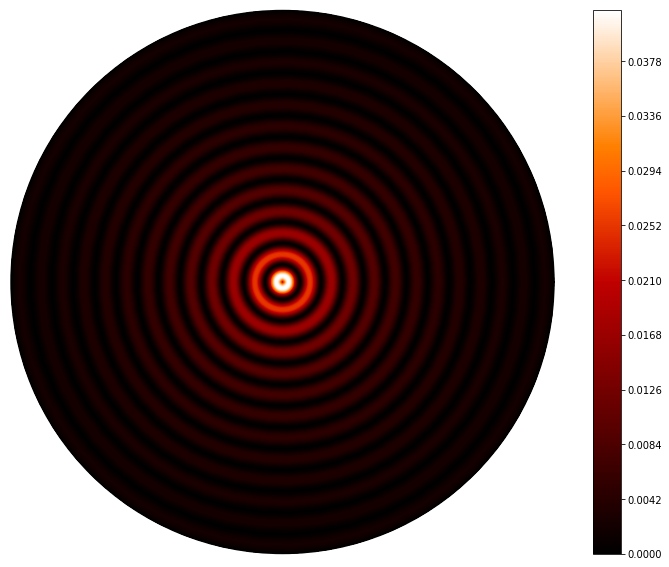

In [5]:
# unitless values for laziness
aperture_diameter = 1
wavelength = 0.5
distance_from_screen = 2
energy_through_aperture = 20

radii = np.linspace(10, 50.0, 500)
angles = np.linspace(0, 2 * np.pi, 50)
intensities = intensity(radii, aperture_diameter, wavelength, distance_from_screen, energy_through_aperture)
intensities = np.tile(intensities, (angles.size, 1)).T

ax = plt.subplot(polar=True)
ax.grid(False)
ax.set_xticklabels([])
ax.set_yticklabels([])

import matplotlib.cm as cm
ctf = ax.contourf(angles, radii, intensities, 1000, cmap=cm.gist_heat) # first colormap I tried but clearly what `poppy` uses, too!
plt.colorbar(ctf)

In [6]:
# unitless values for laziness
aperture_diameter = 1
wavelength = 0.5
distance_from_screen = 2
energy_through_aperture = 20

radii = np.linspace(10, 50.0, 500)
angles = np.linspace(0, 2 * np.pi, 50)

ax = plt.subplot(polar=True)
ax.grid(False)
ax.set_xticklabels([])
ax.set_yticklabels([])

import matplotlib.cm as cm

intensities = intensity(radii, aperture_diameter, wavelength, distance_from_screen, energy_through_aperture)
intensities = np.tile(intensities, (angles.size, 1)).T
contour_set = ax.contourf(angles, radii, intensities, 1000, cmap=cm.gist_heat)

def animate(i):
    intensities[:] = intensity(radii, aperture_diameter * (i + 1) / num_frames, wavelength, distance_from_screen, energy_through_aperture).reshape(-1, 1)
    ax.contourf(angles, radii, intensities, 1000, cmap=cm.gist_heat)
    # only using a single array works, but looks all wiggly (in a kind of cool way)

num_frames = 10
anim = animation.FuncAnimation(ax.figure, animate, frames=num_frames, interval=1_000/frames_per_sec)
plt.close()
HTML(anim.to_html5_video())

## Doppler Effect

In [15]:
circles = []

fig, axes = plt.subplots(2, 1, figsize=(8, 13), gridspec_kw={'height_ratios':[2/3,1/3]})
ax = axes[0]
freq_ax = axes[1]
ax.set_xlim([-1, 1])
ax.set_ylim([-1, 1])
ax.set_xlabel('Displacement x (m)')
ax.set_ylabel('Displacement y (m)')
freq_ax.set_xlabel('Doppler frequency (m/s)')
freq_ax.set_ylabel('Time (s)')

emitter_scatter = ax.scatter([0, 0], [0, 0], c=['b', 'r'])
num_frames = 100
velocity_wave = 2 / num_frames
frequency_wave = 1 / 2 # in units `cycles/frame` (or `cycles/sec` with 1 frame == 1 sec)

doppler_frequencies = np.zeros(num_frames)
freq_line, = freq_ax.plot(doppler_frequencies, c='r')

def doppler_frequency(frequency_wave, velocity_source, velocity_receiver, away=0):
    return frequency_wave * (velocity_wave + velocity_receiver) / (velocity_wave + velocity_source)

def animate(frame):
    if abs(frame * frequency_wave - int(frame * frequency_wave)) < 1e-6:
        circle = plt.Circle(location_source.copy(), 0.001, color='b', fill=False)
        ax.add_artist(circle)
        circles.append(circle)
    location_source[0] += velocity_source
    location_receiver[0] += velocity_receiver
    for i, circle in enumerate(circles):
         circle.set_radius(circle.get_radius() + velocity_wave)
    emitter_scatter.set_offsets([location_source, location_receiver])

    moving_towards = location_receiver[0] > location_source[0]

    directional_v_source = -abs(velocity_source) if moving_towards else abs(velocity_source)
    directional_v_receiver = abs(velocity_receiver) if moving_towards else -abs(velocity_receiver)
    doppler_freq = doppler_frequency(frequency_wave, directional_v_source, directional_v_receiver, location_source[0] > location_receiver[0])
    doppler_frequencies[frame] = doppler_freq
    freq_line.set_ydata(doppler_frequencies)
    freq_ax.set_xlim([0, max(1, frame)])
    freq_ax.set_ylim([doppler_frequencies.min() - 1, doppler_frequencies.max() + 1])

doppler_videos = []

for title in ['Stationary Receiver', 'Stationary Source', 'Both Moving']:
    ax.artists.clear()
    circles.clear()
    location_source = [0.0 if title == 'Stationary Source' else -0.75, 0.0]
    location_receiver = [0.0 if title == 'Stationary Receiver' else 0.75, 0.0]
    velocity_source = 0 if title == 'Stationary Source' else 0.75 * velocity_wave
    velocity_receiver = 0 if title == 'Stationary Receiver' else -0.75 * velocity_wave
    ax.set_title(title, size=14)
    anim = animation.FuncAnimation(ax.figure, animate, frames=num_frames, interval=1_000/frames_per_sec)
    plt.close()
    doppler_videos.append(HTML(anim.to_html5_video()))

In [16]:
doppler_videos[0]

In [17]:
doppler_videos[1]

In [18]:
doppler_videos[2]